# Ideas from supervisor meeting

In [1]:
# The basics
import numpy as np
import pandas as pd

# Plotting
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.pylab as pl
import matplotlib as mpl
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms
import matplotlib.ticker as ticker
mpl.rc('font',family='Helvetica')

# Cross validation and model selection
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV

# Looping
import itertools

# Preproccessing (scaler, etc.)
from sklearn.preprocessing import StandardScaler

# Models
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.multioutput import RegressorChain




In [2]:
# For data from sensor2, change the file name below
path_to_data = '../../data/sensor1.csv'
sensor = pd.read_csv(path_to_data)

# Preview
sensor

,exposure,NO,NO2,NH3,0.05-1-slope-0,0.05-1-slope-1,0.05-1-slope-2,0.05-1-slope-3,0.05-1-slope-4,0.05-1-slope-5,...,2500.0-1-avg-230,2500.0-1-avg-231,5000.0-1-avg-232,5000.0-1-avg-233,5000.0-1-avg-234,5000.0-1-avg-235,5000.0-1-avg-236,5000.0-1-avg-237,5000.0-1-avg-238,5000.0-1-avg-239
0,1.0,10.0,5.0,20.0,-18.855169,-28.289268,-0.390916,-0.234549,-0.143336,0.026061,...,36.095859,36.118662,35.978584,35.880855,35.880855,35.867825,35.874340,35.825476,35.840135,35.845021
1,1.0,10.0,5.0,20.0,-28.979886,-9.251672,-0.247580,-0.169397,-0.218261,0.061895,...,36.115405,36.144723,35.978584,35.962296,35.919947,35.899858,35.910174,35.861309,35.884113,35.869996
2,1.0,10.0,5.0,20.0,-25.431240,-12.874158,-0.221519,-0.234549,0.026061,-0.312733,...,36.163183,36.141466,35.962296,35.926462,35.916689,35.910174,35.906916,35.903659,35.913432,35.900401
3,1.0,10.0,5.0,20.0,-30.126572,-8.196200,-0.260610,-0.091214,-0.130305,-0.182427,...,36.170784,36.164269,36.076313,35.978584,35.946008,35.942750,35.910174,35.933792,35.939493,35.900401
4,2.0,20.0,40.0,40.0,-19.506695,-27.051368,-0.456068,-0.403946,-0.208488,-0.256267,...,35.955781,35.929720,35.805930,35.760323,35.711458,35.688655,35.685397,35.675624,35.685397,35.665852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,374.0,80.0,80.0,40.0,-27.937445,-10.891346,-0.206317,0.021718,-0.130306,-0.152023,...,34.395375,34.410849,34.261813,34.184172,34.165170,34.203175,34.164084,34.132593,34.151596,34.127164
1496,375.0,20.0,80.0,5.0,-24.358394,-22.933723,-0.206316,-0.284500,-0.078183,-0.180256,...,34.395918,34.374201,34.276472,34.212948,34.193402,34.181458,34.157025,34.184172,34.134765,34.132593
1497,375.0,20.0,80.0,5.0,-28.862612,-9.827186,-0.197630,-0.065153,-0.138992,-0.206317,...,34.408406,34.428495,34.281358,34.216749,34.180372,34.180372,34.154311,34.157025,34.159740,34.131507
1498,375.0,20.0,80.0,5.0,-25.839531,-12.780772,-0.184599,-0.143336,-0.052122,-0.097729,...,34.414921,34.388860,34.333481,34.214034,34.178743,34.186887,34.190145,34.144538,34.143452,34.138023


In [3]:
# Gasses (factors)
gasses = ['NO', 'NO2', 'NH3']

# Concentrations (levels)
concentrations = [5, 10, 20, 40, 80]

# Indexes
indexes = list(range(1, 241))

# Unique possible mixtures (cartesian product of sets)
mixtures = list(itertools.product(concentrations, repeat = len(gasses)))
n_mixtures = len(mixtures)

# Location of slope and average features in the df
slope_idxs = list(range(4,244))
avg_idxs = list(range(244, 484))

## Averaging all unique concentrations

In [4]:
mix_avg_df = pd.DataFrame(columns = sensor.columns)

print('Appending averaged features rows...')
for mix, i in zip(mixtures, range(n_mixtures)):

    # Filtering
    maskNO = sensor['NO'] == mix[0]
    maskNO2 = sensor['NO2'] == mix[1]
    maskNH3 = sensor['NH3'] == mix[2]
    masked = sensor[(maskNO) & (maskNO2) & (maskNH3)]
    
    # Averaging all slopes and averages per UNIQUE mixture
    avg_features = masked.mean(axis = 0)[4:]
    
    # Joining everything in a row for easy appending
    avg_row = pd.DataFrame([i] + list(mix) + list(avg_features)).transpose()
    avg_row.columns = sensor.columns
    
    # Populating Average features dataframe
    mix_avg_df = mix_avg_df.append(avg_row)
    
# Converting exposure to int
mix_avg_df['exposure'] = mix_avg_df['exposure'].astype(int)
# Setting exposure # to index
mix_avg_df.set_index('exposure', inplace=True)
print('DONE.')


Appending averaged features rows...
DONE.


In [5]:
# Saving to csv
save_path = '../../data/averaged_features_sensor1.csv'
mix_avg_df.to_csv(save_path)

In [6]:
# Reading from csv just to check everything is working as intended
mix_avg_df = pd.read_csv(save_path)
mix_avg_df.set_index('exposure', inplace=True)
mix_avg_df

,NO,NO2,NH3,0.05-1-slope-0,0.05-1-slope-1,0.05-1-slope-2,0.05-1-slope-3,0.05-1-slope-4,0.05-1-slope-5,0.05-1-slope-6,...,2500.0-1-avg-230,2500.0-1-avg-231,5000.0-1-avg-232,5000.0-1-avg-233,5000.0-1-avg-234,5000.0-1-avg-235,5000.0-1-avg-236,5000.0-1-avg-237,5000.0-1-avg-238,5000.0-1-avg-239
exposure,,,,,,,,,,,,,,,,,,,,,
0,5.0,5.0,5.0,-26.386178,-14.165356,-0.234640,-0.091757,-0.103611,-0.074383,-0.062981,...,35.418769,35.408092,35.281180,35.205123,35.206299,35.186754,35.183971,35.150467,35.162932,35.152458
1,5.0,5.0,10.0,-26.294332,-14.421532,-0.216090,-0.126324,-0.107321,-0.071034,-0.075197,...,34.869225,34.864293,34.732586,34.668700,34.649606,34.643928,34.639743,34.628251,34.622460,34.623591
2,5.0,5.0,20.0,-25.514491,-15.174588,-0.253371,-0.157995,-0.108769,-0.090761,-0.070491,...,35.287604,35.281044,35.147368,35.088776,35.064683,35.051404,35.046087,35.026926,35.025637,35.023103
3,5.0,5.0,40.0,-25.906221,-14.565139,-0.306851,-0.142612,-0.155371,-0.041716,-0.094471,...,34.835653,34.827193,34.692861,34.639381,34.608072,34.611329,34.597168,34.593820,34.575699,34.576649
4,5.0,5.0,80.0,-26.731849,-13.795072,-0.241065,-0.139716,-0.165596,-0.061352,-0.116551,...,35.112620,35.105132,34.979939,34.911710,34.899019,34.891848,34.873184,34.865515,34.860040,34.854340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,80.0,80.0,5.0,-27.073901,-13.562242,-0.218533,-0.112207,-0.119356,-0.104968,-0.105511,...,35.008036,34.999938,34.875876,34.795566,34.779550,34.769189,34.756339,34.753489,34.742313,34.749349
121,80.0,80.0,10.0,-26.329623,-14.337196,-0.120442,-0.155733,-0.177360,0.004253,-0.093838,...,34.931301,34.930781,34.800000,34.737336,34.714669,34.697521,34.697249,34.684468,34.678857,34.675690
122,80.0,80.0,20.0,-25.935631,-14.734990,-0.196363,-0.119447,-0.110036,-0.099629,-0.072663,...,34.621871,34.606443,34.487268,34.418043,34.394041,34.385965,34.385354,34.375468,34.354338,34.347416


In [7]:
print(mix_avg_df.iloc[120:125, [0,1,2,243,244, 481, 482]].to_latex(index = False))

\begin{tabular}{rrrrrrr}
\toprule
   NO &   NO2 &   NH3 &  0.05-1-avg-0 &  0.05-1-avg-1 &  5000.0-1-avg-238 &  5000.0-1-avg-239 \\
 80.0 &  80.0 &   5.0 &     28.548244 &     25.157684 &         34.742313 &         34.749349 \\
\midrule
 80.0 &  80.0 &  10.0 &     28.630183 &     25.045884 &         34.678857 &         34.675690 \\
 80.0 &  80.0 &  20.0 &     28.420835 &     24.737087 &         34.354338 &         34.347416 \\
 80.0 &  80.0 &  40.0 &     28.457189 &     24.743263 &         34.327938 &         34.319839 \\
 80.0 &  80.0 &  80.0 &     28.615161 &     25.093255 &         34.743829 &         34.734124 \\
\bottomrule
\end{tabular}



## Plotting with 4 colours (Annika's suggestion) 

#### UN-NORMALIZED 

In [8]:
# Location of slope and average features in the df (NOW WITH MIXTURE # AS DF INDEX!!!)
slope_idxs = list(range(3,243))
avg_idxs = list(range(243, 483))

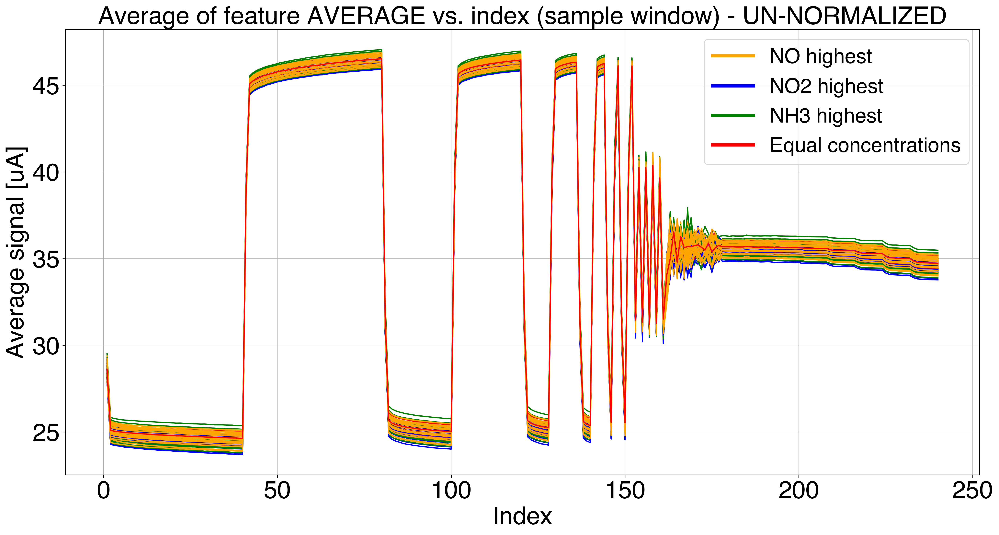

In [36]:
# UN-NORMALIZED PLOT
fig = plt.figure(figsize = (20,10), dpi = 300)
plt.title('Average of feature AVERAGE vs. index (sample window) - UN-NORMALIZED',
          fontname = 'Helvetica', fontsize = 30)
plt.xlabel('Index', fontname = 'Helvetica', fontsize = 30)
plt.ylabel('Average signal [uA]', fontname = 'Helvetica', fontsize = 30)

for i in range(mix_avg_df.shape[0]):
   
    # Case 1: NO is the highest concentration gas
    if (mix_avg_df.loc[i, 'NO'] > mix_avg_df.loc[i, 'NO2']) &  (mix_avg_df.loc[i, 'NO'] > mix_avg_df.loc[i, 'NH3']):
        plt.plot(indexes, mix_avg_df.iloc[i, avg_idxs], color = 'orange')
        
    # Case 2: NO2 is highest
    elif (mix_avg_df.loc[i, 'NO2'] > mix_avg_df.loc[i, 'NO']) &  (mix_avg_df.loc[i, 'NO2'] > mix_avg_df.loc[i, 'NH3']):
        plt.plot(indexes, mix_avg_df.iloc[i, avg_idxs], color = 'blue')
    
    # Case 3: NH3 is highest
    elif (mix_avg_df.loc[i, 'NH3'] > mix_avg_df.loc[i, 'NO']) &  (mix_avg_df.loc[i, 'NH3'] > mix_avg_df.loc[i, 'NO2']):
        plt.plot(indexes, mix_avg_df.iloc[i, avg_idxs], color = 'green')
    
    # Case 4: Equal concentrations
    elif (mix_avg_df.loc[i, 'NO2'] == mix_avg_df.loc[i, 'NO']) &  (mix_avg_df.loc[i, 'NO2'] == mix_avg_df.loc[i, 'NH3']):
        plt.plot(indexes, mix_avg_df.iloc[i, avg_idxs], color = 'red')


# Custom legend
custom_lines = [Line2D([0], [0], color='orange', lw=4),
                Line2D([0], [0], color='blue', lw=4),
                Line2D([0], [0], color='green', lw=4),
                Line2D([0], [0], color='red', lw=4)]
plt.legend(custom_lines,
           ['NO highest', 'NO2 highest', 'NH3 highest', 'Equal concentrations'],
           prop={'size': 25})

# Grid and ticks
plt.tick_params(axis='both', which='major', labelsize=30)
plt.tick_params(axis='both', which='minor', labelsize=30)
plt.grid(linestyle='-', linewidth=0.5)

plt.show()

#### NORMALIZED

In [10]:
# Normalizing features to have 0 mean and unit variance

# Dependent Variables - gas concentrations
y = np.asarray(mix_avg_df.iloc[:, :3])

# Independent variables - shape features
X = np.asarray(mix_avg_df.iloc[:, 3:])

# Scaling data
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)
scaled_X = pd.DataFrame(scaled_X)
y = pd.DataFrame(y)
scaled = pd.concat((y, scaled_X), axis = 1)
colnames = mix_avg_df.columns
scaled.columns = colnames

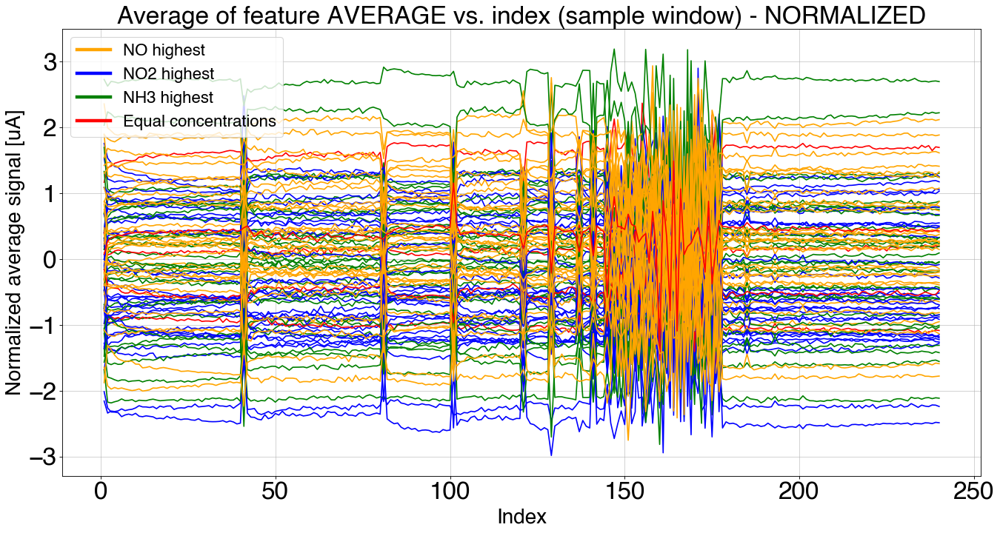

In [32]:
# NORMALIZED plot
fig = plt.figure(figsize = (20,10), dpi = 80)
plt.title('Average of feature AVERAGE vs. index (sample window) - NORMALIZED', fontname = 'Helvetica', fontsize = 30)
plt.xlabel('Index', fontname = 'Helvetica', fontsize = 25)
plt.ylabel('Normalized average signal [uA]', fontname = 'Helvetica', fontsize = 25)

for i in range(scaled.shape[0]):
   
    # Case 1: NO is the highest concentration gas
    if (scaled.loc[i, 'NO'] > scaled.loc[i, 'NO2']) &  (scaled.loc[i, 'NO'] > scaled.loc[i, 'NH3']):
        plt.plot(indexes, scaled.iloc[i, avg_idxs], color = 'orange')
        
    # Case 2: NO2 is highest
    elif (scaled.loc[i, 'NO2'] > scaled.loc[i, 'NO']) &  (scaled.loc[i, 'NO2'] > scaled.loc[i, 'NH3']):
        plt.plot(indexes, scaled.iloc[i, avg_idxs], color = 'blue')
    
    # Case 3: NH3 is highest
    elif (scaled.loc[i, 'NH3'] > scaled.loc[i, 'NO']) &  (scaled.loc[i, 'NH3'] > scaled.loc[i, 'NO2']):
        plt.plot(indexes, scaled.iloc[i, avg_idxs], color = 'green')
    
    # Case 4: Equal concentrations
    elif (scaled.loc[i, 'NO2'] == scaled.loc[i, 'NO']) &  (scaled.loc[i, 'NO2'] == scaled.loc[i, 'NH3']):
        plt.plot(indexes, scaled.iloc[i, avg_idxs], color = 'red')


# Custom legend
custom_lines = [Line2D([0], [0], color='orange', lw=4),
                Line2D([0], [0], color='blue', lw=4),
                Line2D([0], [0], color='green', lw=4),
                Line2D([0], [0], color='red', lw=4)]
plt.legend(custom_lines,
           ['NO highest', 'NO2 highest', 'NH3 highest', 'Equal concentrations'],
           prop={'size': 20})

# Grid and ticks
plt.tick_params(axis='both', which='major', labelsize=30)
plt.tick_params(axis='both', which='minor', labelsize=30)
plt.grid(linestyle='-', linewidth=0.5)

plt.show()

# Plotting features PER GAS, and not per mixture

In [12]:
colors = ['orange', 'blue', 'green', 'red', 'purple']

<Figure size 2400x1200 with 0 Axes>

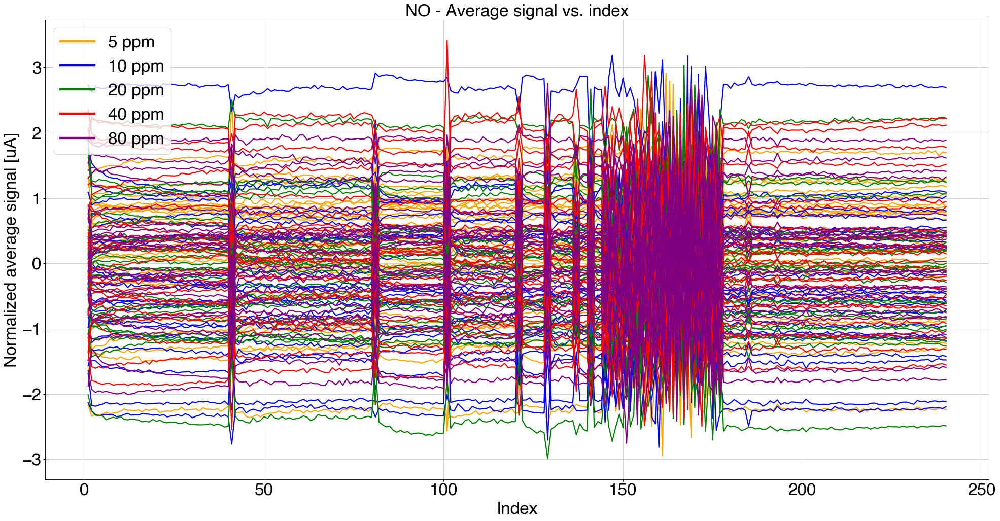

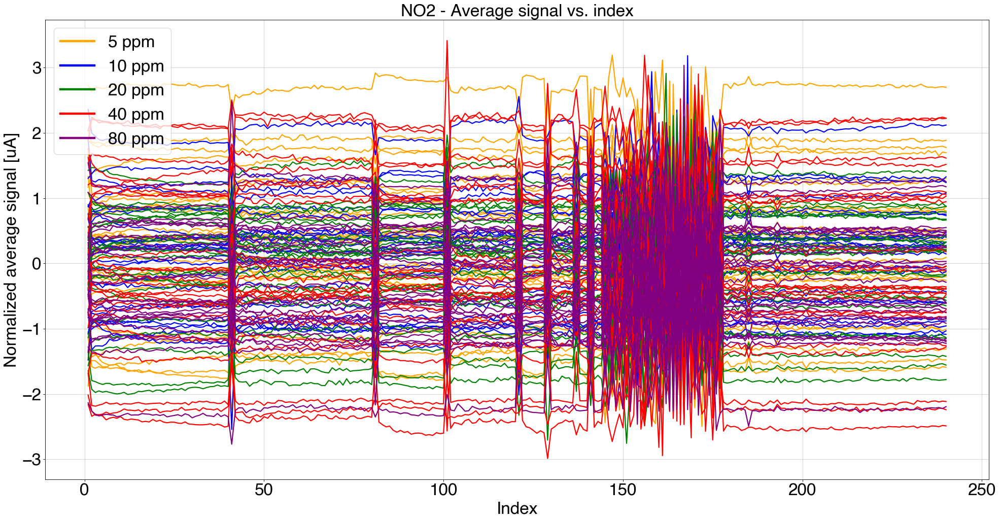

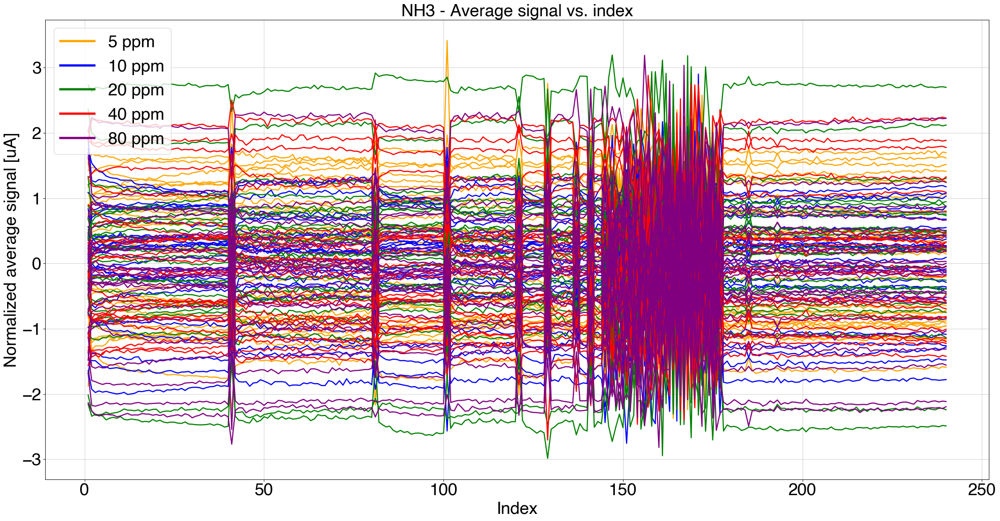

In [13]:
fig = plt.figure(figsize = (30,15), dpi = 80)
for gas in gasses:
    fig = plt.figure(figsize = (30,15), dpi = 80)
    for i in range(len(concentrations)):
        mask = scaled[gas] == concentrations[i]
        masked = scaled[mask]
        for j in range(masked.shape[0]):
            plt.plot(indexes, masked.iloc[j, avg_idxs], color = colors[i], lw = 2)
        
        # Title, axes, etc.
        plt.title(f'{gas} - Average signal vs. index', fontsize = 30)
        plt.xlabel('Index', fontname = 'Helvetica', fontsize = 30)
        plt.ylabel('Normalized average signal [uA]', fontname = 'Helvetica', fontsize = 30)


    # Custom legend
    custom_lines = [Line2D([0], [0], color='orange', lw=4),
                    Line2D([0], [0], color='blue', lw=4),
                    Line2D([0], [0], color='green', lw=4),
                    Line2D([0], [0], color='red', lw=4),
                   Line2D([0], [0], color='purple', lw=4)]
    plt.legend(custom_lines,
               ['5 ppm', '10 ppm', '20 ppm', '40 ppm', '80 ppm'],
               prop={'size': 30}, loc = 'best')

# Grid and ticks
    plt.tick_params(axis='both', which='major', labelsize=30)
    plt.tick_params(axis='both', which='minor', labelsize=30)
    plt.grid(linestyle='-', linewidth=0.5)    
    plt.show()

## Trying regression on averaged features and on AVERAGE ONLY

In [14]:
def plot_actual_vs_pred(actual, pred, title, info):
    
    # Gasses
    gasses = ['NO', 'NO_2', 'NH_3']
    
    # Getting axis limits to have uniform plots for all gasses
    axis_min = pred.min()
    axis_max = pred.max()
    
    print(axis_min)
    print(axis_max)
    
    # Dividing into 3 subplots
    fig, axs = plt.subplots(1,3, figsize=(30,10), dpi = 80)
    
    # Main title
    fig.suptitle(title, fontsize=35)
    
     # Axis params
    plt.xticks(rotation=45)
    
    
    for i, ax in enumerate(axs.flat):
        
        # Data
        ax.scatter(actual[:,i], pred[:,i], c='black', alpha = 0.4)
        
        # Identity line y=x
        line = mlines.Line2D([0, 1], [0, 1], color='red')
        transform = ax.transAxes
        line.set_transform(transform)
        ax.add_line(line)
        
        # Text box with information of the fit
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.6)
        textstr = info
        ax.text(0.05, 0.95,
                textstr,
                transform = ax.transAxes,
                fontsize = 20,
                verticalalignment = 'top',
                bbox = props,
                fontname = 'Helvetica'
               )
        
        # Plot title and axis names
        ax.set_title(f'${gasses[i]}$', fontname = 'Helvetica', fontsize = 30)
        ax.set_ylabel('Predicted (ppm)', fontname = 'Helvetica', fontsize = 25)
        ax.set_xlabel('Actual (ppm)', fontname = 'Helvetica', fontsize = 25)
        
        # Setting axis limits (defined above)
        if axis_min >0 or axis_max < 80:
            ax.set_xlim(-5, 85)
            ax.set_ylim(-5, 85)
        else:
            ax.set_xlim(axis_min + 5, axis_max + 5)
            ax.set_ylim(axis_min + 5, axis_max + 5)
        
        # Setting minor ticks in fixed levels (5, 10, 20, 40, 80)
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5,10,20,40,80]))
        ax.yaxis.set_minor_locator(ticker.FixedLocator([5,10,20,40,80]))
        
        # Major tick style
        ax.grid(linestyle='-', linewidth=0.5)
        ax.tick_params(axis='x', which='major', labelsize=20, rotation = 45)
        # Font size of tick labels (numbers)
        ax.tick_params(axis='both', which='major', labelsize=20)
        
        # Minor tick style
        ax.grid(axis = 'x', which = 'minor',linestyle=':', linewidth=0.5,color = "fuchsia")
        ax.tick_params(which = 'minor', axis="x", direction="in",
                       length=10, width=3, color="fuchsia", rotation = 45, labelsize = 12)
        ax.xaxis.set_minor_formatter('{x:.0f}')
        
        
    
    plt.show()

In [15]:
# Dependent Variables - gas concentrations
Y = np.asarray(scaled.iloc[:, :3])

# Independent variables - AVERAGE ONLY!!!!!!!!!!!!
X = np.asarray(scaled.iloc[:, avg_idxs])

In [16]:
# Train test split
X, X_val, Y, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

#### OLS

In [17]:
steps = [('poly', PolynomialFeatures()),
         ('linreg', LinearRegression())]

params = [{'poly__degree':list(range(1,3))}]

pipe = Pipeline(steps)

grid_search = GridSearchCV(pipe,
                           params,
                           scoring = 'neg_root_mean_squared_error',
                           return_train_score=True
                          )

# Fitting to training data (test data is implicitly inside CV search.)
grid_search.fit(X, Y)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

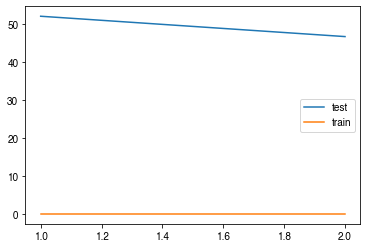

In [18]:
test_scores = grid_search.cv_results_['mean_test_score'] * - 1
train_scores = grid_search.cv_results_['mean_train_score'] * -1 

plt.plot(list(range(1,3)),test_scores, label='test')
plt.plot(list(range(1,3)), train_scores, label='train')
plt.legend(loc='best')
plt.show()

-74.48260299086178
122.45989357275013


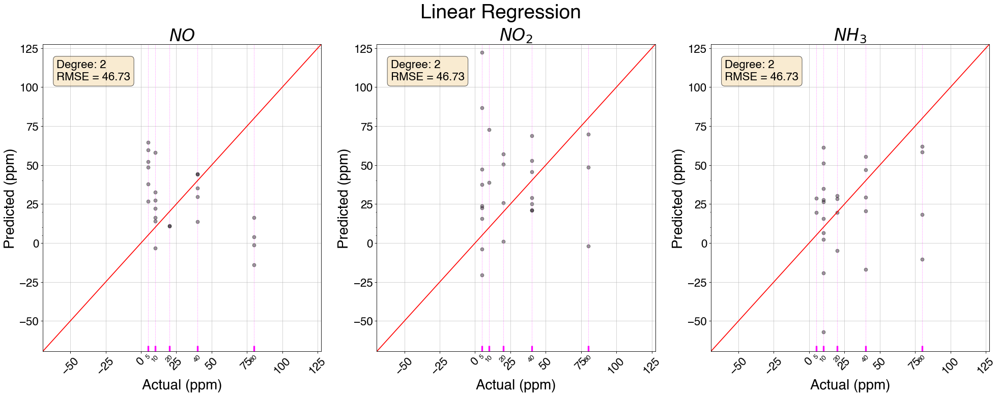

In [19]:
# Predicting on unseen validation data
Y_pred = grid_search.best_estimator_.predict(X_val)

# Plotting actual vs. predicted
# Information to display
info = f"Degree: {best_params['poly__degree']}\nRMSE = {round((best_score * -1), 2)}"
plot_actual_vs_pred(Y_val, Y_pred, 'Linear Regression', info)    

#### PCR

In [20]:
steps = [('PCA', PCA()),
         ('linreg', LinearRegression())]

n_PC = list(range(1,80))

params = [{'PCA__n_components':n_PC}]

pipe = Pipeline(steps)

grid_search = GridSearchCV(pipe,
                           params,
                           scoring = 'neg_root_mean_squared_error',
                           return_train_score=True)

grid_search.fit(X, Y)
#pipe.fit(X, y)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

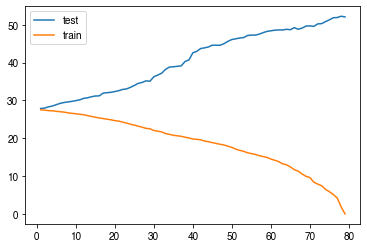

In [21]:
test_scores = -grid_search.cv_results_['mean_test_score']
train_scores = -grid_search.cv_results_['mean_train_score']

plt.plot(n_PC,test_scores, label='test')
plt.plot(n_PC,train_scores, label='train')
plt.legend(loc='best')
plt.show()

22.08211924842679
39.80640461852474


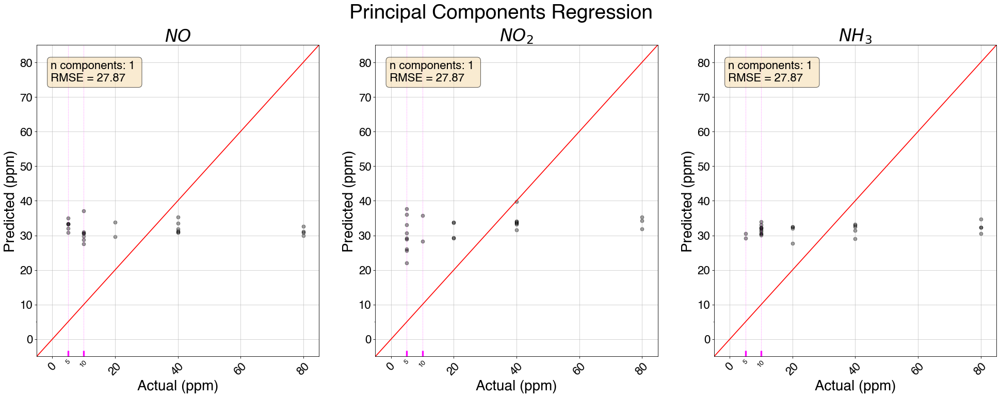

In [22]:
# Predicting on unseen validation data
Y_pred = grid_search.best_estimator_.predict(X_val)

#y_pred = pipe.predict(X_val)

# Plotting actual vs. predicted
#Information to display
info = f"n components: {best_params['PCA__n_components']} \nRMSE = {round((best_score * -1), 2)}"
plot_actual_vs_pred(Y_val, Y_pred, 'Principal Components Regression', info)    

#### PLSR

In [23]:
steps = [('PLSR', PLSRegression())]

n_comps = list(range(1,80))

params = [{'PLSR__n_components':n_comps}]

pipe = Pipeline(steps)

grid_search = GridSearchCV(pipe,
                           params,
                           scoring = 'neg_root_mean_squared_error',
                           return_train_score=True
                          )

grid_search.fit(X, Y)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

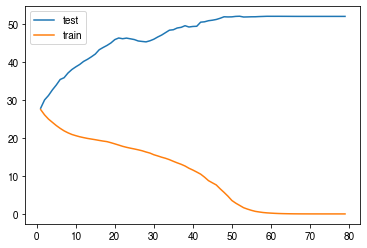

In [24]:
test_scores = -grid_search.cv_results_['mean_test_score']
train_scores = -grid_search.cv_results_['mean_train_score']

plt.plot(n_comps,test_scores, label='test')
plt.plot(n_comps,train_scores, label='train')
plt.legend(loc='best')
plt.show()

21.75764374556273
40.06449149708085


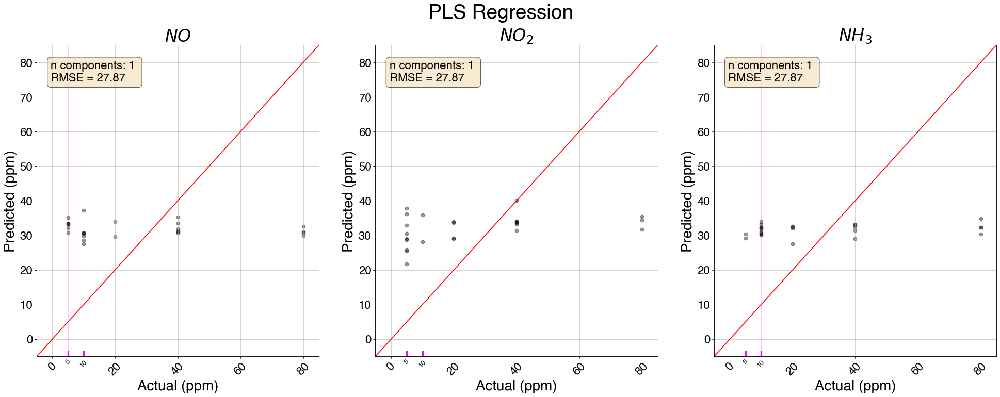

In [25]:
# Predicting on unseen validation data
Y_pred = grid_search.best_estimator_.predict(X_val)


# Plotting actual vs. predicted
#Information to display
info = f"n components: {best_params['PLSR__n_components']} \nRMSE = {round((best_score * -1), 2)}"
plot_actual_vs_pred(Y_val, Y_pred, 'PLS Regression', info)    

## PCA on AVERAGE ONLY - 4 COLORS

In [26]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [27]:
# Dependent Variables - gas concentrations
Y = np.asarray(scaled.iloc[:, :3])

# Independent variables - AVERAGE ONLY!!!!!!!!!!!!
X = np.asarray(scaled.iloc[:, avg_idxs])

In [28]:
import plotly.express as px

# Instatiating
pca = PCA()

# Fitting
pcs = pca.fit(X)

exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

In [29]:
# Running PCA with 2 components
# Instatiating
pca = PCA(n_components = 2)

# Fitting
pcs = pca.fit_transform(X)
pc_df = pd.DataFrame(pcs, columns = ['PC1', 'PC2']) 

# Summary
pca_df = pd.concat((pd.DataFrame(Y, columns = list(scaled.columns)[0:3]), pc_df), axis = 1)
pca_df.head(10)

,NO,NO2,NH3,PC1,PC2
0,5.0,5.0,5.0,24.499199,-2.154796
1,5.0,5.0,10.0,-0.465109,-1.275641
2,5.0,5.0,20.0,17.596528,-2.954466
3,5.0,5.0,40.0,-0.153891,-2.805374
4,5.0,5.0,80.0,11.590043,3.765046
5,5.0,10.0,5.0,-14.534556,-1.753526
6,5.0,10.0,10.0,5.358513,-0.133990
7,5.0,10.0,20.0,11.761541,1.372152
8,5.0,10.0,40.0,4.994855,-0.030595
9,5.0,10.0,80.0,-13.073420,1.479381


In [30]:
pca_df.shape[0]

125

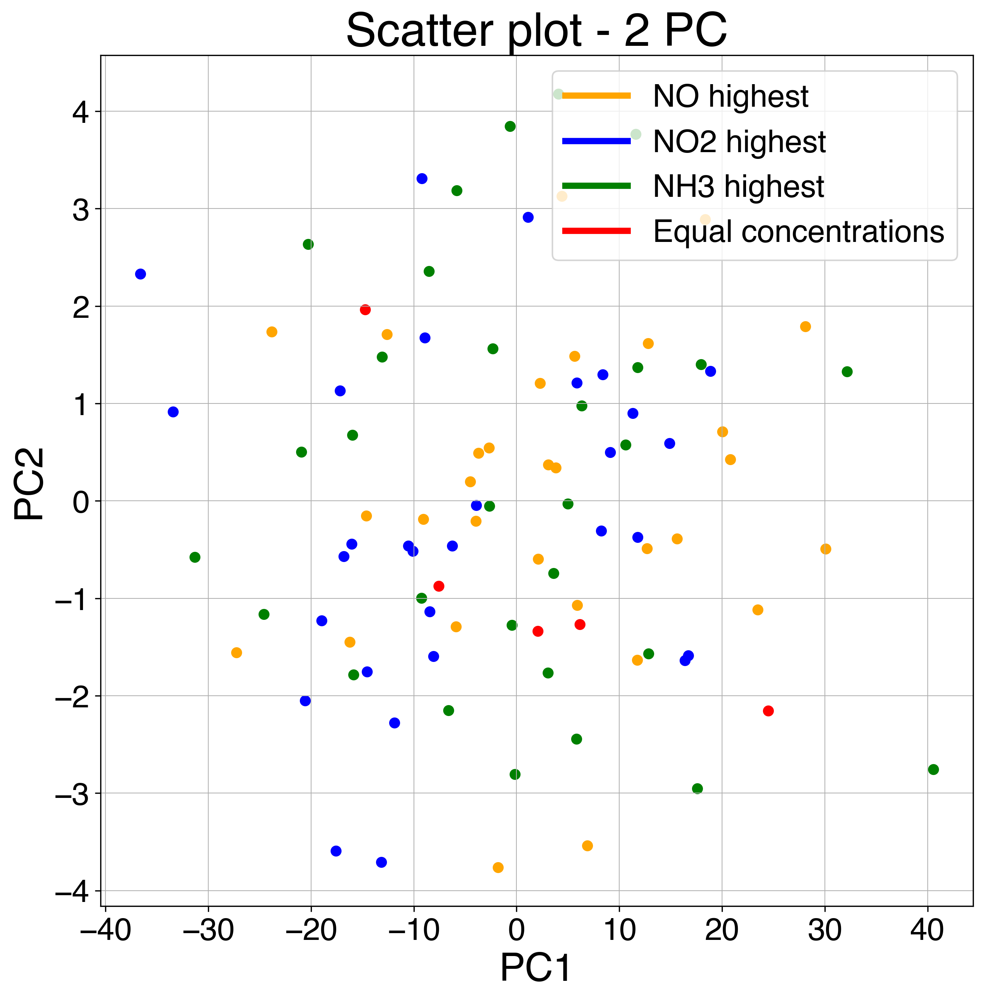

In [31]:
# UN-NORMALIZED PLOT
fig = plt.figure(figsize = (10,10), dpi = 300)
plt.title('Scatter plot - 2 PC', fontname = 'Helvetica', fontsize = 30)
plt.xlabel('PC1', fontname = 'Helvetica', fontsize = 25)
plt.ylabel('PC2', fontname = 'Helvetica', fontsize = 25)

for i in range(pca_df.shape[0]):
   
    # Case 1: NO is the highest concentration gas
    if (pca_df.loc[i, 'NO'] > pca_df.loc[i, 'NO2']) &  (pca_df.loc[i, 'NO'] > pca_df.loc[i, 'NH3']):
        plt.scatter(pca_df.loc[i, 'PC1'], pca_df.loc[i, 'PC2'], color = 'orange')
        
    # Case 2: NO2 is highest
    elif (pca_df.loc[i, 'NO2'] > pca_df.loc[i, 'NO']) &  (pca_df.loc[i, 'NO2'] > pca_df.loc[i, 'NH3']):
        plt.scatter(pca_df.loc[i, 'PC1'], pca_df.loc[i, 'PC2'], color = 'blue')
    
    # Case 3: NH3 is highest
    elif (pca_df.loc[i, 'NH3'] > pca_df.loc[i, 'NO']) &  (pca_df.loc[i, 'NH3'] > pca_df.loc[i, 'NO2']):
        plt.scatter(pca_df.loc[i, 'PC1'], pca_df.loc[i, 'PC2'], color = 'green')
    
    # Case 4: Equal concentrations
    elif (pca_df.loc[i, 'NO2'] == pca_df.loc[i, 'NO']) &  (pca_df.loc[i, 'NO2'] == pca_df.loc[i, 'NH3']):
        plt.scatter(pca_df.loc[i, 'PC1'], pca_df.loc[i, 'PC2'], color = 'red')


# Custom legend
custom_lines = [Line2D([0], [0], color='orange', lw=4),
                Line2D([0], [0], color='blue', lw=4),
                Line2D([0], [0], color='green', lw=4),
                Line2D([0], [0], color='red', lw=4)]
plt.legend(custom_lines,
           ['NO highest', 'NO2 highest', 'NH3 highest', 'Equal concentrations'],
           prop={'size': 20})

# Grid and ticks
plt.tick_params(axis='both', which='major', labelsize=20)
plt.tick_params(axis='both', which='minor', labelsize=20)
plt.grid(linestyle='-', linewidth=0.5)

plt.show()